<a href="https://colab.research.google.com/github/roxyrong/w281-project/blob/main/edge_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import copy
from glob import glob
import numpy as np
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split
from skimage.feature import hog, canny
from skimage.transform import hough_line
import cv2
from dog import DoG, LDoG

from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
def load_dataset(datapath):
    df = pd.DataFrame( )

    for folder in os.listdir(datapath):
        files = glob(pathname= str(datapath + folder + '/*.jpg'))
        df = pd.concat( [ df, pd.DataFrame( { 'filename': files ,
                                              'category': folder } ) ] )

    df = df.sort_values(by="category", ignore_index=True)

    return df

In [ ]:
train_path = 'drive/MyDrive/github/w281-project-me/dataset/seg_train/seg_train/'
data_df = load_dataset(train_path)

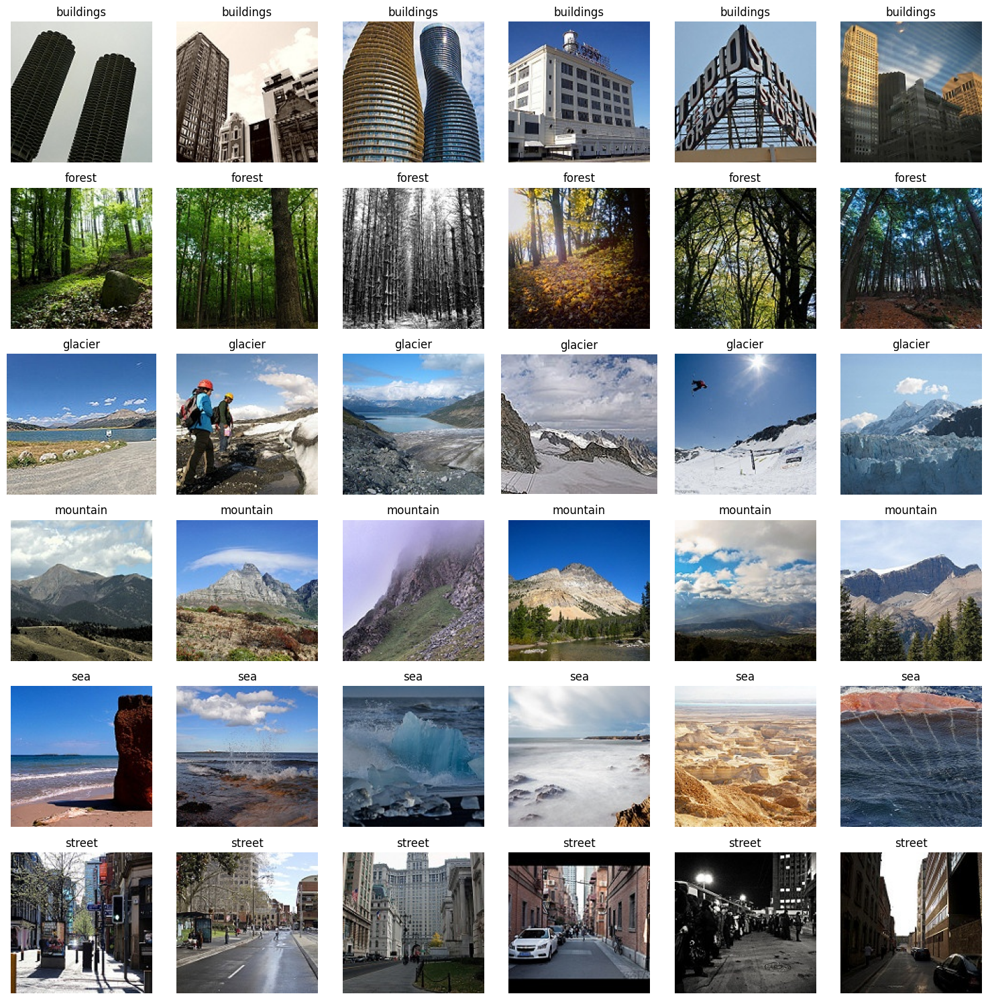

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(15, 15))

sample_df = data_df.groupby("category").head(6).reset_index().copy(deep=True)
sample_df['image'] = None
sample_df['gray_image'] = None
for idx, row in sample_df.iterrows():

    category = row['category']
    img = Image.open(row['filename'])
    sample_df.at[idx, 'image'] = np.array(img, dtype=np.float32)
    sample_df.at[idx, 'gray_image'] = np.array(img.convert('L'))
    ax[idx // 6 ][idx % 6 ].imshow(img)
    ax[idx // 6 ][idx % 6 ].axis('off')
    ax[idx // 6 ][idx % 6 ].set_title(category)

plt.tight_layout()
plt.show()

In [ ]:
sample_df.iloc[0]['image']

array([[[214., 216., 211.],
        [214., 216., 211.],
        [215., 217., 212.],
        ...,
        [215., 220., 216.],
        [214., 219., 215.],
        [214., 219., 215.]],

       [[214., 216., 211.],
        [214., 216., 211.],
        [215., 217., 212.],
        ...,
        [214., 219., 215.],
        [214., 219., 215.],
        [213., 218., 214.]],

       [[214., 216., 211.],
        [215., 217., 212.],
        [215., 217., 212.],
        ...,
        [215., 220., 216.],
        [215., 220., 216.],
        [215., 220., 216.]],

       ...,

       [[  0.,   1.,   0.],
        [  8.,  10.,   7.],
        [  0.,   2.,   0.],
        ...,
        [173., 184., 180.],
        [173., 184., 180.],
        [173., 184., 180.]],

       [[ 37.,  39.,  36.],
        [  0.,   1.,   0.],
        [  0.,   1.,   0.],
        ...,
        [172., 183., 179.],
        [173., 184., 180.],
        [172., 183., 179.]],

       [[ 18.,  20.,  17.],
        [ 57.,  59.,  56.],
        [ 30.,  

In [ ]:
## HOG feature
def add_hog_feature(row):
  row['hog_feature'], row['hog_image'] = hog(row['image'],
                                             orientations=8,
                                             pixels_per_cell=(15, 15),
                                             cells_per_block=(1, 1),
                                             visualize=True,
                                             channel_axis=-1)

  return row

sample_df = sample_df.apply(add_hog_feature, axis=1)

In [ ]:
## Canny Edge Detection
def add_canny_feature(row):
  row['canny_feature_sigma1'] = canny(row['gray_image'],
                                      sigma=1)
  row['canny_feature_sigma2'] = canny(row['gray_image'],
                                      sigma=2)

  return row

sample_df = sample_df.apply(add_canny_feature, axis=1)

In [ ]:
## HED Edge Detection
## https://github.com/s9xie/hed

def blob_batch_processing(original_images):
  images = copy.deepcopy(original_images)
  images = images.apply(lambda x: cv2.resize(x, (299, 299)))
  images = np.array(images)
  blob = cv2.dnn.blobFromImages(images, scalefactor=1, size=(299, 299),
    mean=(105, 117, 123), #MODEL MEAN VALUE
    swapRB=True, crop=False)
  blob = list(blob)
  blob = [b[np.newaxis, :]for b in blob]
  return blob

# The pre-trained model that OpenCV uses has been trained in Caffe framework
proto_path = 'drive/MyDrive/github/w281-project-me/third_party/HED/deploy.prototxt'
model_path = 'drive/MyDrive/github/w281-project-me/third_party/HED/hed_pretrained_bsds.caffemodel'
net = cv2.dnn.readNetFromCaffe(proto_path, model_path)

# batch process blob
sample_df['blob'] = blob_batch_processing(sample_df['image'])

def add_HED_feature(row):
  net.setInput(row['blob'])
  hed = net.forward()
  hed = cv2.resize(np.squeeze(hed), (150, 150))
  hed = cv2.cvtColor(hed, cv2.COLOR_GRAY2BGR)
  hed = (255 * hed).astype("uint8")
  row['hed'] = hed
  return row

sample_df = sample_df.apply(add_HED_feature, axis=1)

In [ ]:
sample_df.iloc[0]['hed'][50][50]

array([0, 0, 0], dtype=uint8)

## Feature Visualization

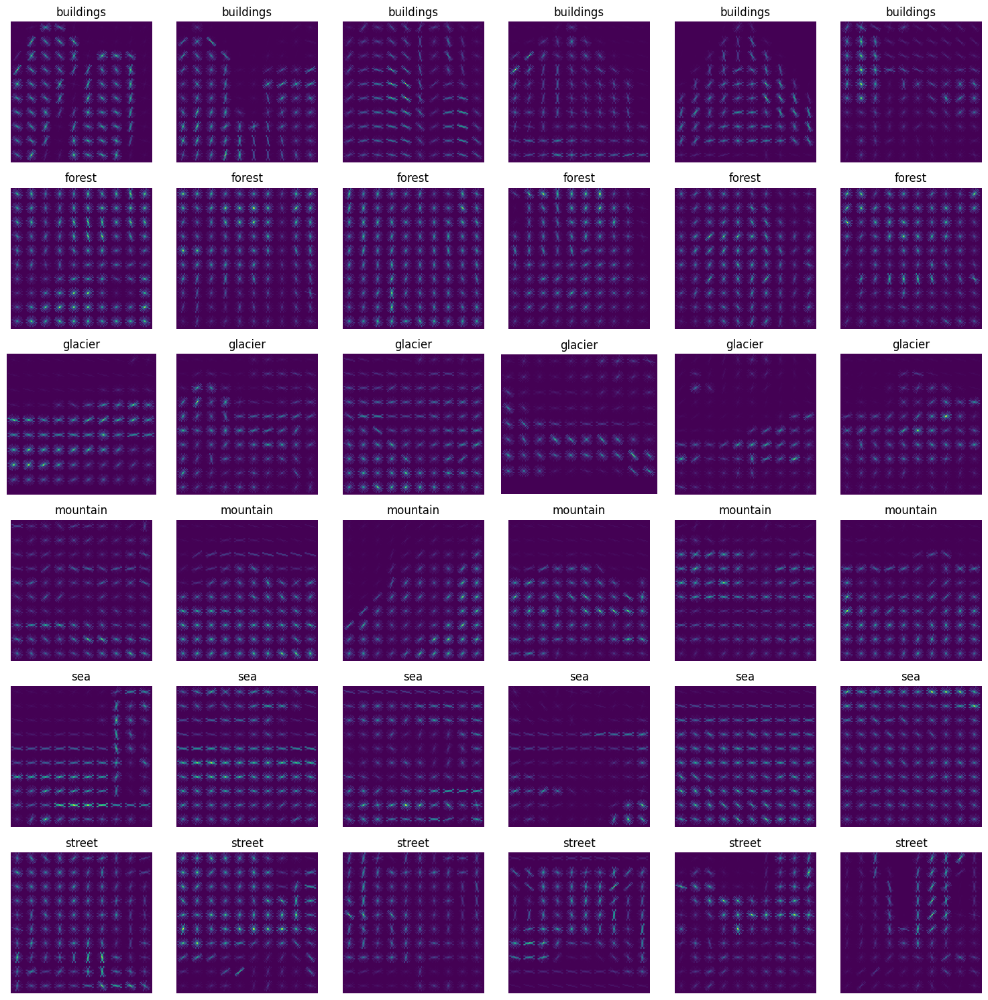

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(15, 15))

for idx, row in sample_df.iterrows():

    ax[idx // 6 ][idx % 6 ].imshow(row['hog_image'])
    ax[idx // 6 ][idx % 6 ].axis('off')
    ax[idx // 6 ][idx % 6 ].set_title(row['category'])

plt.tight_layout()
plt.show()

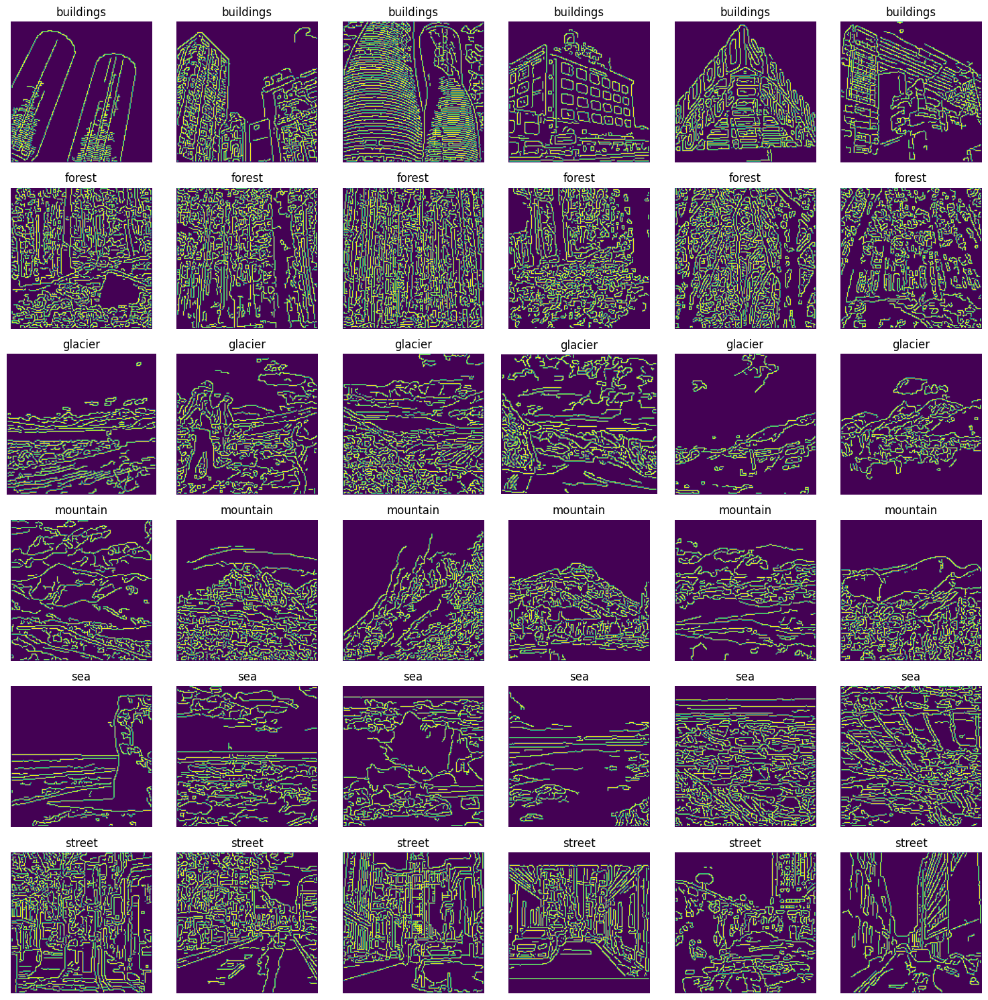

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(15, 15))

for idx, row in sample_df.iterrows():

    ax[idx // 6 ][idx % 6 ].imshow(row['canny_feature_sigma1'])
    ax[idx // 6 ][idx % 6 ].axis('off')
    ax[idx // 6 ][idx % 6 ].set_title(row['category'])

plt.tight_layout()
plt.show()

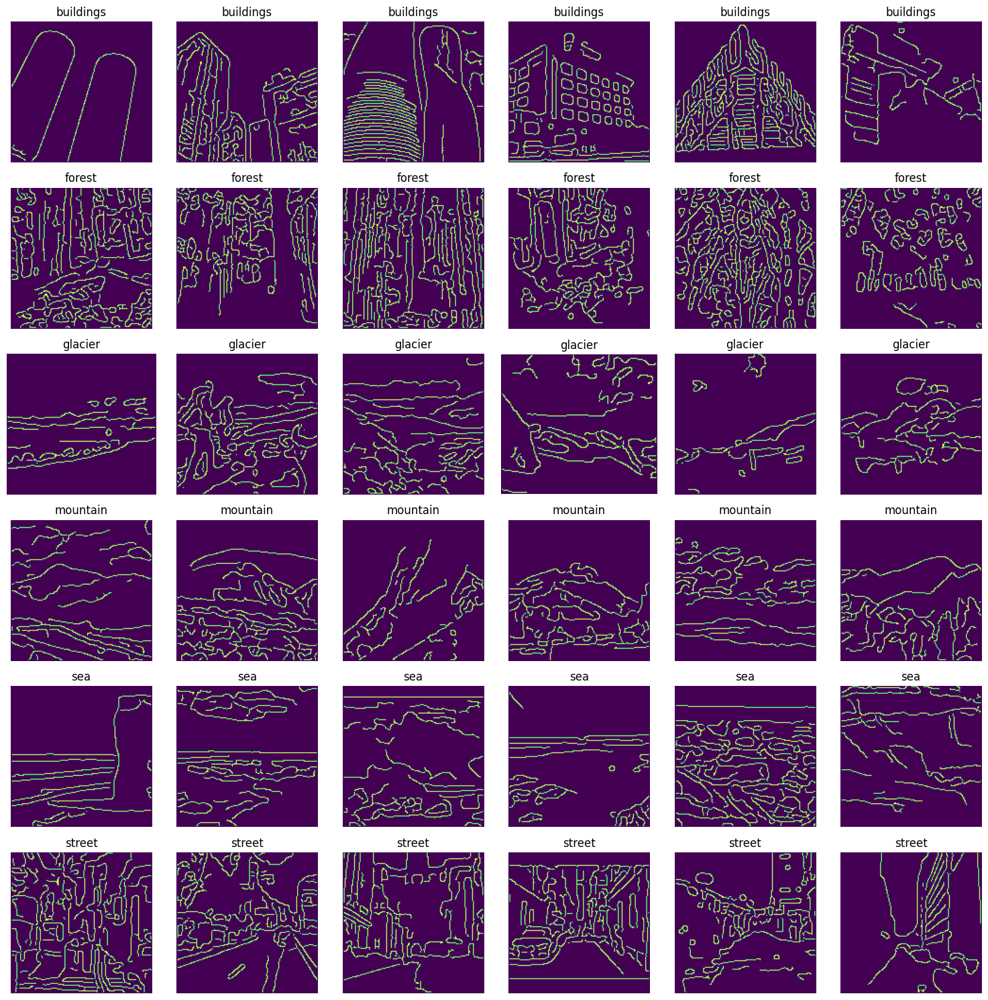

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(15, 15))

for idx, row in sample_df.iterrows():

    ax[idx // 6 ][idx % 6 ].imshow(row['canny_feature_sigma2'])
    ax[idx // 6 ][idx % 6 ].axis('off')
    ax[idx // 6 ][idx % 6 ].set_title(row['category'])

plt.tight_layout()
plt.show()

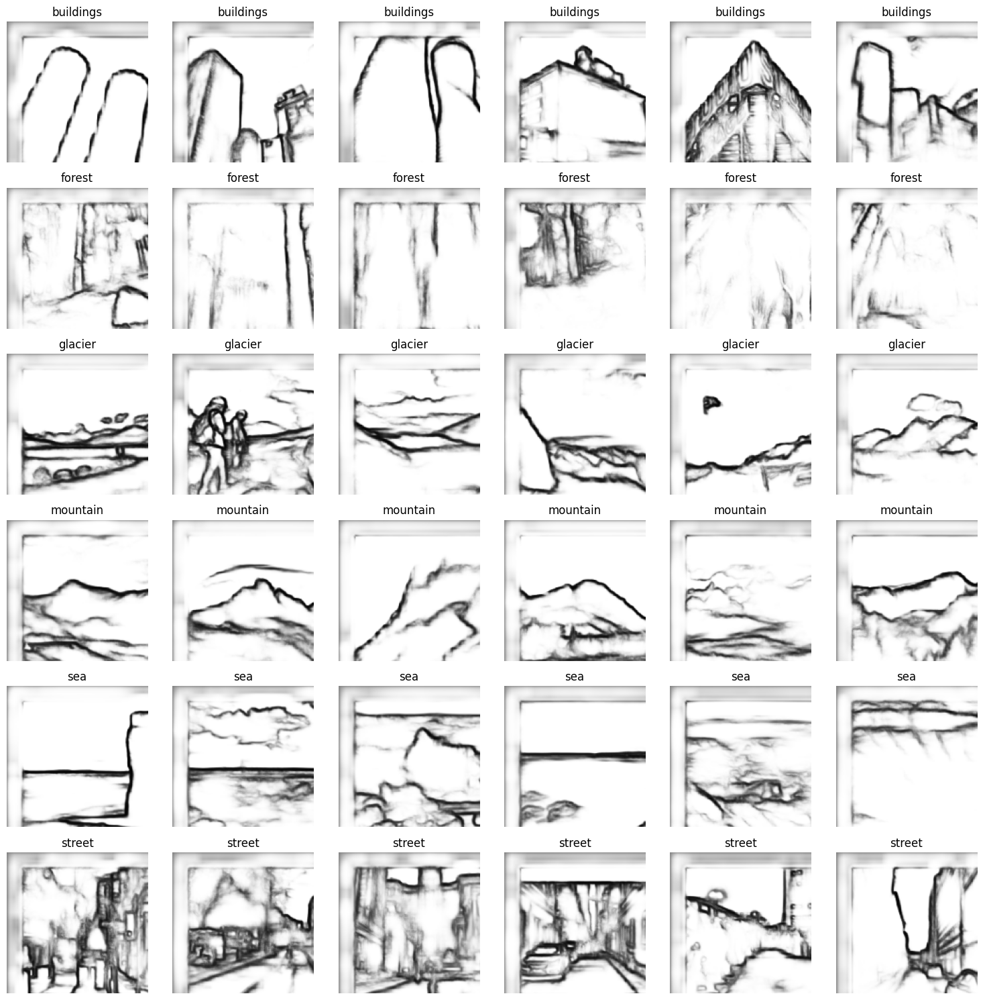

In [ ]:
fig, ax = plt.subplots(6, 6, figsize=(15, 15))

for idx, row in sample_df.iterrows():
    ax[idx // 6 ][idx % 6 ].imshow(255 - row['hed'])
    ax[idx // 6 ][idx % 6 ].axis('off')
    ax[idx // 6 ][idx % 6 ].set_title(row['category'])

plt.tight_layout()
plt.show()